Number of images in Normal class: 1589
Number of images in Osteoarthritis class: 2257


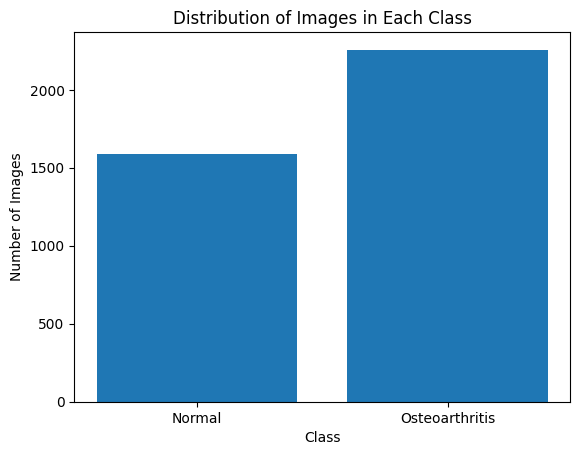

In [1]:
import os
import cv2
import matplotlib.pyplot as plt

def load_and_resize_images_from_folder(folder, target_size=(224, 224)):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.resize(img, target_size)
            images.append(img)
    return images

# Load images from directories for each class
normal_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Normal')
osteoarthritis_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Osteoarthritis')

# Display the number of images in each class
print("Number of images in Normal class:", len(normal_images))
print("Number of images in Osteoarthritis class:", len(osteoarthritis_images))

# Create a histogram to visualize the distribution of images in each class
plt.bar(['Normal', 'Osteoarthritis'], [len(normal_images), len(osteoarthritis_images)])
plt.title('Distribution of Images in Each Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.show()


2024-03-25 13:42:46.648372: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-03-25 13:42:46.649179: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-25 13:42:46.686297: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-25 13:42:46.834391: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-25 13:42:47.363171: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warnin

Number of images in Normal class: 1589
Number of images in Osteoarthritis class: 2257
Number of images in Normal class after augmentation: 2257


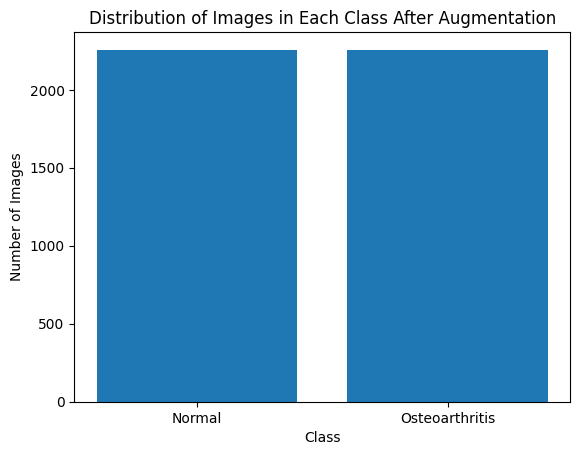

In [2]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Define a function to load and resize images from a folder
def load_and_resize_images_from_folder(folder, target_size=(224, 224)):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.resize(img, target_size)
            images.append(img)
    return images

# Load images from directories for each class
normal_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Normal')
osteoarthritis_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Osteoarthritis')

# Display the number of images in each class
print("Number of images in Normal class:", len(normal_images))
print("Number of images in Osteoarthritis class:", len(osteoarthritis_images))

# Check if data augmentation is needed
if len(normal_images) < len(osteoarthritis_images):
    # Calculate the number of additional images needed
    num_additional_images = len(osteoarthritis_images) - len(normal_images)

    # Create an ImageDataGenerator for data augmentation
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Choose random indices from the "Normal" class for augmentation
    sampled_indices = np.random.randint(0, len(normal_images), size=num_additional_images)

    # Perform data augmentation and append augmented images to the "Normal" class
    for index in sampled_indices:
        img = normal_images[index]
        img = img.reshape((1,) + img.shape)  # Reshape for flow() function
        for batch in datagen.flow(img, batch_size=1):
            normal_images.append(batch[0])  # Append augmented images
            break  # Exit the loop after one iteration of data augmentation

    # Display the number of images in the "Normal" class after augmentation
    print("Number of images in Normal class after augmentation:", len(normal_images))

# Create a histogram to visualize the distribution of images in each class after augmentation
plt.bar(['Normal', 'Osteoarthritis'], [len(normal_images), len(osteoarthritis_images)])
plt.title('Distribution of Images in Each Class After Augmentation')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.show()


In [3]:
import random

# Set a seed for reproducibility
random.seed(42)

# Randomly select 1000 images from each class
selected_normal_images = random.sample(normal_images, 1000)
selected_osteoarthritis_images = random.sample(osteoarthritis_images, 1000)

# Combine selected images from both classes
selected_images = selected_normal_images + selected_osteoarthritis_images
labels = [0] * 1000 + [1] * 1000  # Assign labels (0 for Normal, 1 for Osteoarthritis)

# Split the selected images and labels into train and test sets (70:30 ratio)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_images, labels, test_size=0.3, random_state=42)

# Split the train set into train and validation sets (80:20 ratio)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Print the sizes of train, test, and validation sets
print("X_train size:", len(X_train))
print("X_test size:", len(X_test))
print("X_validation size:", len(X_val))


X_train size: 1120
X_test size: 600
X_validation size: 280


In [4]:
import cv2

def preprocess_image_cv2(image):
    # Resize image to (224, 224)
    resized_image = cv2.resize(image, (224, 224))
    # Scale pixel values to [0, 1]
    normalized_image = resized_image / 255.0
    return normalized_image

# Preprocess images in your dataset
X_train_preprocessed = np.array([preprocess_image_cv2(img) for img in X_train])
X_val_preprocessed = np.array([preprocess_image_cv2(img) for img in X_val])
X_test_preprocessed = np.array([preprocess_image_cv2(img) for img in X_test])

In [5]:
import pandas as pd
from sklearn.metrics import cohen_kappa_score,balanced_accuracy_score,matthews_corrcoef

# Denset201

In [6]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,290,113 (77.40 MB)

 Trainable params: 1,968,129 (7.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [7]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.6285 - loss: 0.6434 - val_accuracy: 0.8250 - val_loss: 0.4707
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8045 - loss: 0.4533 - val_accuracy: 0.8357 - val_loss: 0.4086
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8665 - loss: 0.3687 - val_accuracy: 0.8643 - val_loss: 0.3562
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8686 - loss: 0.3342 - val_accuracy: 0.8536 - val_loss: 0.3498
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8843 - loss: 0.3148 - val_accuracy: 0.8679 - val_loss: 0.3236
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9005 - loss: 0.3013 - val_accuracy: 0.8643 - val_loss: 0.3187
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8988 - loss: 0.2795 - val_accuracy: 0.8679 - val_loss: 0.3171
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9108 - loss: 0.2722 - val_accuracy: 0.8786 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step 
Inference Time: 11.424731254577637 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 839ms/step


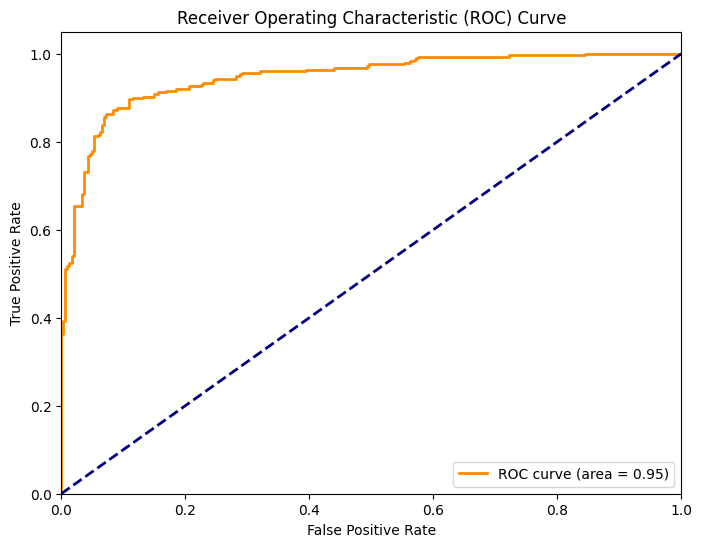

Validation Loss: 0.2646211087703705
Validation Accuracy: 0.8928571343421936
Test Loss: 0.2905661463737488
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9467420774256634
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [8]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv', index=False)
print("Metrics saved successfully")

In [9]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9495 - loss: 0.1622 - val_accuracy: 0.8679 - val_loss: 0.2815
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9501 - loss: 0.1601 - val_accuracy: 0.8714 - val_loss: 0.2735
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9546 - loss: 0.1536 - val_accuracy: 0.8714 - val_loss: 0.2824
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9564 - loss: 0.1387 - val_accuracy: 0.8679 - val_loss: 0.2845
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9559 - loss: 0.1483 - val_accuracy: 0.8821 - val_loss: 0.2739
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9674 - loss: 0.1287 - val_accuracy: 0.8679 - val_loss: 0.2865
Epoch 7/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9659 - loss: 0.1294 - val_accuracy: 0.8714 - val_loss: 0.2637
Epoch 8/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9577 - loss: 0.1423 - val_accuracy: 0.8750 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 817ms/step
Inference Time: 7.478392124176025 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 840ms/step


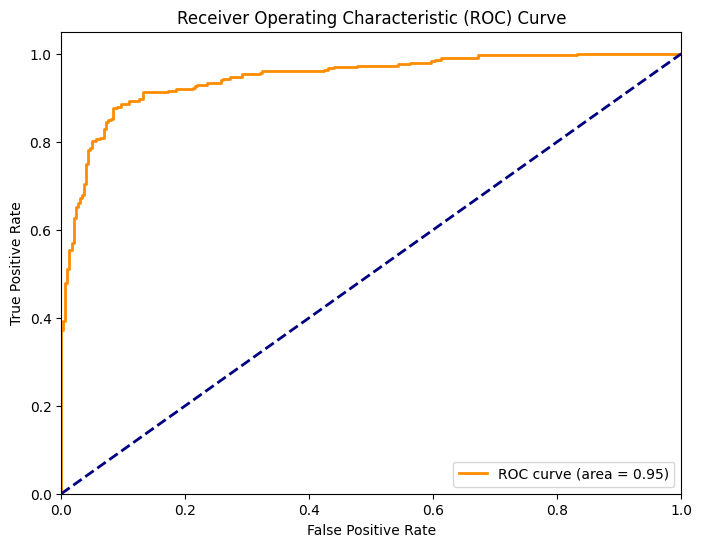

Validation Loss: 0.2637414038181305
Validation Accuracy: 0.8714285492897034
Test Loss: 0.295419305562973
Test Accuracy: 0.8949999809265137
ROC AUC: 0.9459420418685275
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [10]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv', index=False)
print("Metrics saved successfully")

In [11]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9679 - loss: 0.1244 - val_accuracy: 0.8714 - val_loss: 0.2770
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9687 - loss: 0.1292 - val_accuracy: 0.8714 - val_loss: 0.2722
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9698 - loss: 0.1184 - val_accuracy: 0.8750 - val_loss: 0.2654
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9731 - loss: 0.1179 - val_accuracy: 0.8750 - val_loss: 0.2643
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9691 - loss: 0.1235 - val_accuracy: 0.8536 - val_loss: 0.2805
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9765 - loss: 0.1100 - val_accuracy: 0.8821 - val_loss: 0.2707
Epoch 7/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9745 - loss: 0.1107 - val_accuracy: 0.8607 - val_loss: 0.3161
Epoch 8/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9806 - loss: 0.1028 - val_accuracy: 0.8607 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 821ms/step
Inference Time: 7.548405170440674 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 840ms/step


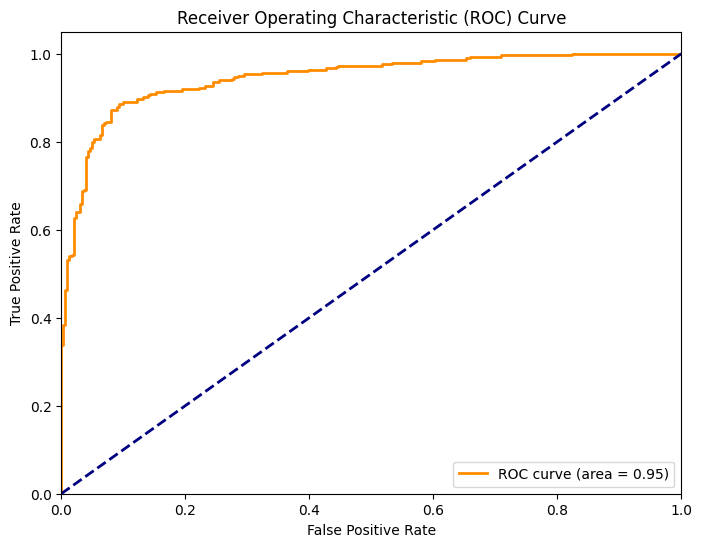

Validation Loss: 0.26434701681137085
Validation Accuracy: 0.875
Test Loss: 0.2980322241783142
Test Accuracy: 0.8949999809265137
ROC AUC: 0.9455420240899596
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [12]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv', index=False)
print("Metrics saved successfully")

In [13]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9738 - loss: 0.1116 - val_accuracy: 0.8821 - val_loss: 0.2662
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9805 - loss: 0.1089 - val_accuracy: 0.8714 - val_loss: 0.2726
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9746 - loss: 0.1074 - val_accuracy: 0.8679 - val_loss: 0.2866
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9832 - loss: 0.0957 - val_accuracy: 0.8821 - val_loss: 0.3020
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9797 - loss: 0.0988 - val_accuracy: 0.8643 - val_loss: 0.2913
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9823 - loss: 0.0948 - val_accuracy: 0.8679 - val_loss: 0.2853
Training Time: 223.98333716392517 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 823ms/step
Inference Time: 7.538624286651611 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 833ms/step


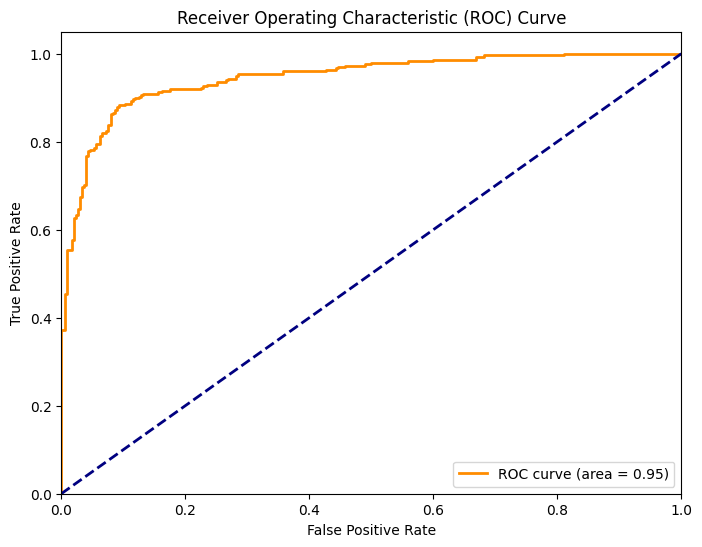

Validation Loss: 0.2661861181259155
Validation Accuracy: 0.8821428418159485
Test Loss: 0.30002620816230774
Test Accuracy: 0.8933333158493042
ROC AUC: 0.9456753633494821
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [14]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv', index=False)
print("Metrics saved successfully")

# Densenet+Dense

In [24]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)  # Output layer for binary classification

# Add an additional dense layer
extra_dense = Dense(512, activation='relu')(predictions)

# Combine base model, custom classification head, and additional dense layer
model = Model(inputs=base_model.input, outputs=extra_dense)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_10   │ (None, 230, 230,  │          0 │ input_layer_5[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_11   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,291,137 (77.40 MB)

 Trainable params: 1,969,153 (7.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [25]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(32,), output.shape=(32, 512)

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [ ]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [ ]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [ ]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Dropout(1)+Dense(2)

In [26]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

# Add first dense layer
x = Dense(512, activation='relu')(x)

# Add dropout layer
x = Dropout(0.5)(x)  # Adding dropout with rate 0.5

# Add second dense layer
x = Dense(256, activation='relu')(x)

predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_12   │ (None, 230, 230,  │          0 │ input_layer_6[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_13   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,945,473 (79.90 MB)

 Trainable params: 2,623,489 (10.01 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [27]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.5742 - loss: 0.6841 - val_accuracy: 0.7893 - val_loss: 0.5290
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.7711 - loss: 0.5299 - val_accuracy: 0.8536 - val_loss: 0.4124
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8079 - loss: 0.4361 - val_accuracy: 0.8643 - val_loss: 0.3500
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8369 - loss: 0.3877 - val_accuracy: 0.8750 - val_loss: 0.3186
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8539 - loss: 0.3280 - val_accuracy: 0.8357 - val_loss: 0.3631
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8668 - loss: 0.3144 - val_accuracy: 0.8786 - val_loss: 0.2883
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8784 - loss: 0.2882 - val_accuracy: 0.8786 - val_loss: 0.2968
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9017 - loss: 0.2614 - val_accuracy: 0.8893 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step 
Inference Time: 11.15940809249878 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 843ms/step


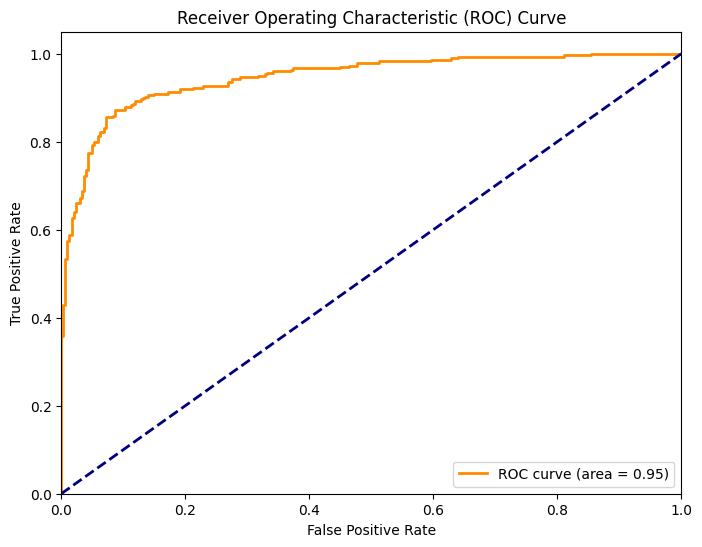

Validation Loss: 0.2619893550872803
Validation Accuracy: 0.8892857432365417
Test Loss: 0.30568572878837585
Test Accuracy: 0.8883333206176758
ROC AUC: 0.9461198275478911
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [28]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [29]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9257 - loss: 0.1775 - val_accuracy: 0.8857 - val_loss: 0.2870
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9481 - loss: 0.1584 - val_accuracy: 0.8821 - val_loss: 0.2615
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9437 - loss: 0.1595 - val_accuracy: 0.8750 - val_loss: 0.2911
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9582 - loss: 0.1174 - val_accuracy: 0.8750 - val_loss: 0.2830
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9482 - loss: 0.1273 - val_accuracy: 0.9000 - val_loss: 0.2819
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9660 - loss: 0.1114 - val_accuracy: 0.8857 - val_loss: 0.2944
Epoch 7/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9519 - loss: 0.1056 - val_accuracy: 0.8714 - val_loss: 0.3254
Training Time: 262.647260427475 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 820ms/step
Inference Time: 7.507062196731567 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 842ms/step


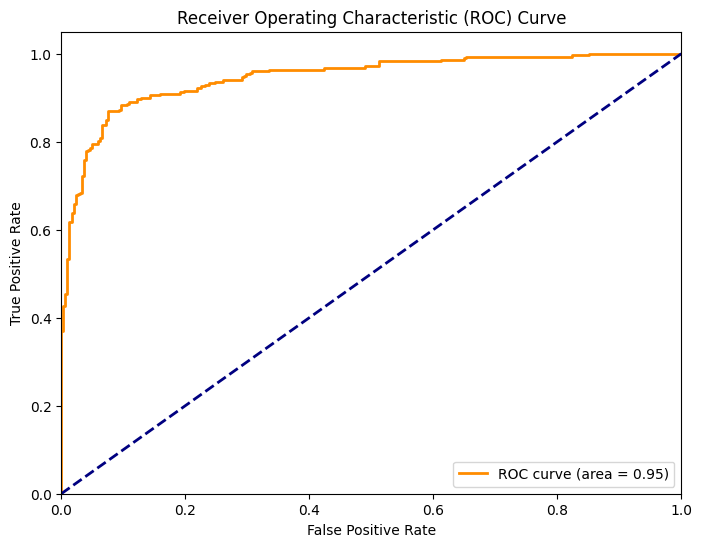

Validation Loss: 0.26152920722961426
Validation Accuracy: 0.8821428418159485
Test Loss: 0.3141423463821411
Test Accuracy: 0.8883333206176758
ROC AUC: 0.946464287301658
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [30]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [31]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9514 - loss: 0.1373 - val_accuracy: 0.8821 - val_loss: 0.2708
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9451 - loss: 0.1530 - val_accuracy: 0.8857 - val_loss: 0.2775
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9404 - loss: 0.1553 - val_accuracy: 0.8821 - val_loss: 0.2883
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9658 - loss: 0.1262 - val_accuracy: 0.8893 - val_loss: 0.2859
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9623 - loss: 0.0974 - val_accuracy: 0.8714 - val_loss: 0.3442
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9663 - loss: 0.0852 - val_accuracy: 0.8857 - val_loss: 0.2868
Training Time: 225.69788932800293 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 822ms/step
Inference Time: 7.533827781677246 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 841ms/step


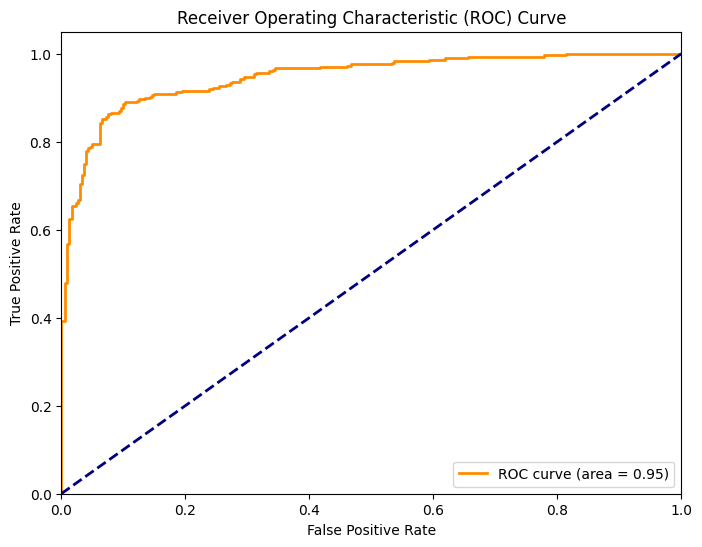

Validation Loss: 0.2708263695240021
Validation Accuracy: 0.8821428418159485
Test Loss: 0.3134268820285797
Test Accuracy: 0.8899999856948853
ROC AUC: 0.9469865327347882
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [32]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [33]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9515 - loss: 0.1286 - val_accuracy: 0.8750 - val_loss: 0.3218
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9577 - loss: 0.1221 - val_accuracy: 0.8786 - val_loss: 0.2924
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9649 - loss: 0.0997 - val_accuracy: 0.8821 - val_loss: 0.2790
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9522 - loss: 0.1134 - val_accuracy: 0.8786 - val_loss: 0.2900
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9723 - loss: 0.0808 - val_accuracy: 0.8679 - val_loss: 0.3947
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9731 - loss: 0.0778 - val_accuracy: 0.8929 - val_loss: 0.3273
Epoch 7/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9739 - loss: 0.0706 - val_accuracy: 0.8786 - val_loss: 0.3074
Epoch 8/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9829 - loss: 0.0579 - val_accuracy: 0.8821 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 827ms/step
Inference Time: 7.592878341674805 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 839ms/step


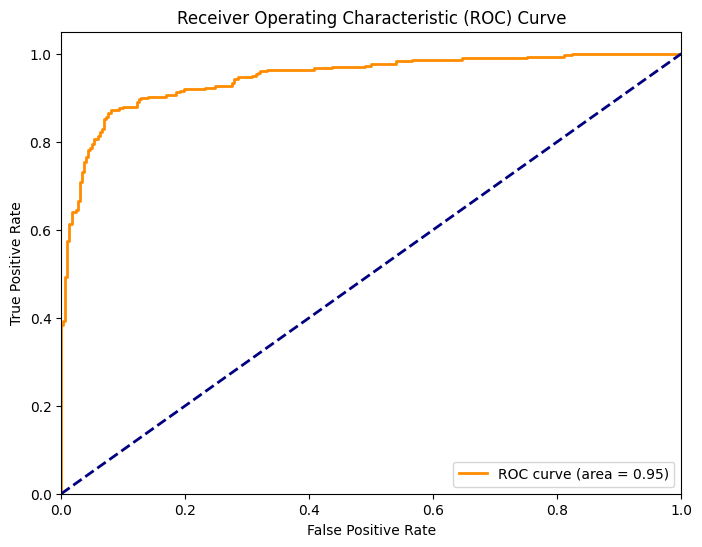

Validation Loss: 0.27900785207748413
Validation Accuracy: 0.8821428418159485
Test Loss: 0.348587304353714
Test Accuracy: 0.8966666460037231
ROC AUC: 0.9458531490288457
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [34]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Dropout(1)+Dense(1)

In [35]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

# Add dense layer
x = Dense(512, activation='relu')(x)

# Add dropout layer
x = Dropout(0.5)(x)  # Adding dropout with rate 0.5

predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_14   │ (None, 230, 230,  │          0 │ input_layer_7[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_15   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,814,401 (79.40 MB)

 Trainable params: 2,492,417 (9.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [36]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.5619 - loss: 0.7040 - val_accuracy: 0.7571 - val_loss: 0.5161
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.7761 - loss: 0.5032 - val_accuracy: 0.8679 - val_loss: 0.3940
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8102 - loss: 0.4189 - val_accuracy: 0.8500 - val_loss: 0.3530
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8531 - loss: 0.3386 - val_accuracy: 0.8500 - val_loss: 0.3300
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8668 - loss: 0.3069 - val_accuracy: 0.8607 - val_loss: 0.3098
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8782 - loss: 0.2949 - val_accuracy: 0.8750 - val_loss: 0.3000
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9030 - loss: 0.2646 - val_accuracy: 0.8786 - val_loss: 0.2847
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9052 - loss: 0.2427 - val_accuracy: 0.8893 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step 
Inference Time: 11.10152530670166 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 850ms/step


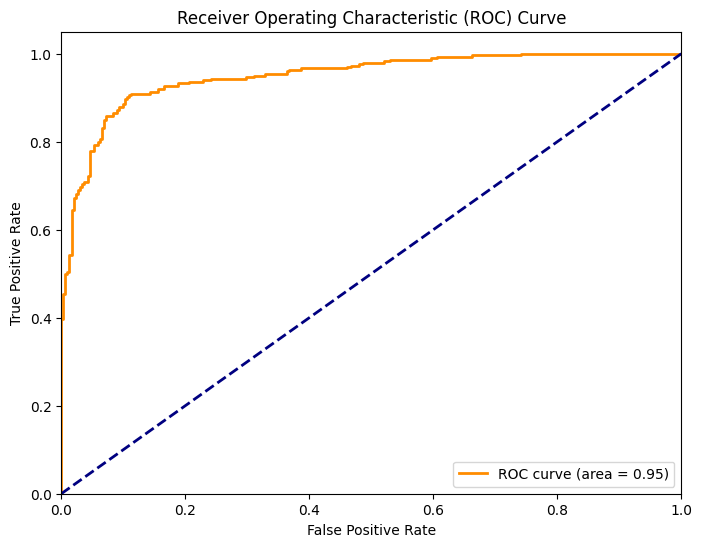

Validation Loss: 0.260619193315506
Validation Accuracy: 0.8928571343421936
Test Loss: 0.28785887360572815
Test Accuracy: 0.8916666507720947
ROC AUC: 0.9494088626161163
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [37]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [38]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9744 - loss: 0.1036 - val_accuracy: 0.8929 - val_loss: 0.2719
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9686 - loss: 0.1046 - val_accuracy: 0.8821 - val_loss: 0.2689
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9689 - loss: 0.1078 - val_accuracy: 0.8750 - val_loss: 0.2663
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9722 - loss: 0.0961 - val_accuracy: 0.8964 - val_loss: 0.2844
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9830 - loss: 0.0788 - val_accuracy: 0.8893 - val_loss: 0.2979
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9872 - loss: 0.0722 - val_accuracy: 0.8714 - val_loss: 0.2725
Epoch 7/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9792 - loss: 0.0667 - val_accuracy: 0.8679 - val_loss: 0.2749
Epoch 8/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9942 - loss: 0.0506 - val_accuracy: 0.8750 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 823ms/step
Inference Time: 7.55201530456543 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 840ms/step


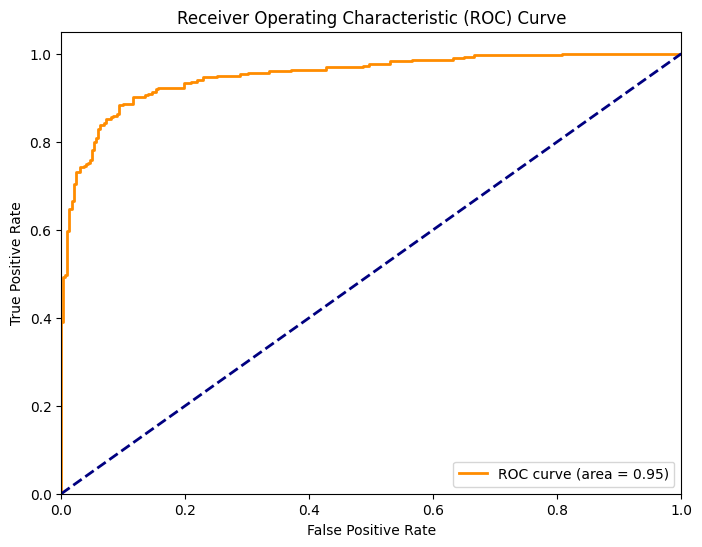

Validation Loss: 0.2663377523422241
Validation Accuracy: 0.875
Test Loss: 0.28846248984336853
Test Accuracy: 0.8933333158493042
ROC AUC: 0.9508644828659053
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [39]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [40]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9820 - loss: 0.0738 - val_accuracy: 0.8964 - val_loss: 0.2689
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.9764 - loss: 0.0742 - val_accuracy: 0.8786 - val_loss: 0.2707
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9839 - loss: 0.0680 - val_accuracy: 0.8679 - val_loss: 0.3304
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9774 - loss: 0.0649 - val_accuracy: 0.8929 - val_loss: 0.2778
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9917 - loss: 0.0518 - val_accuracy: 0.9036 - val_loss: 0.2988
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9927 - loss: 0.0479 - val_accuracy: 0.8750 - val_loss: 0.3100
Training Time: 226.88895869255066 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 825ms/step
Inference Time: 7.639758348464966 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 843ms/step


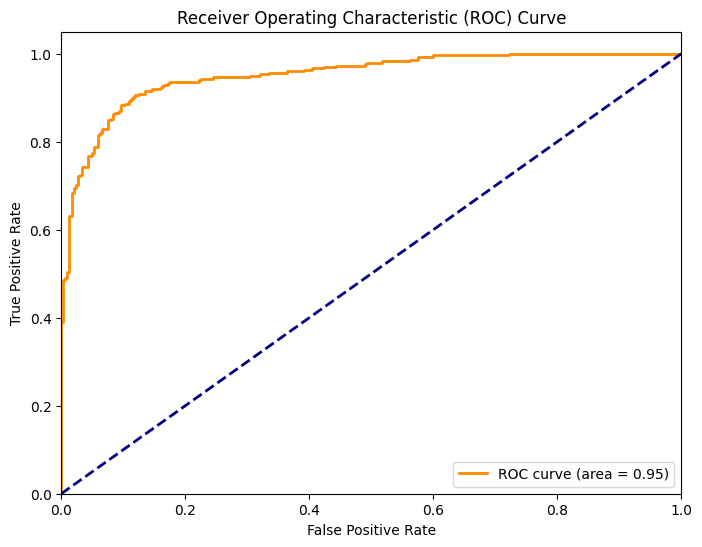

Validation Loss: 0.2688954472541809
Validation Accuracy: 0.8964285850524902
Test Loss: 0.291190505027771
Test Accuracy: 0.8899999856948853
ROC AUC: 0.9513756166940753
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [41]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [42]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9849 - loss: 0.0751 - val_accuracy: 0.8786 - val_loss: 0.2922
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9902 - loss: 0.0767 - val_accuracy: 0.8821 - val_loss: 0.2755
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9804 - loss: 0.0692 - val_accuracy: 0.8857 - val_loss: 0.2871
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9924 - loss: 0.0502 - val_accuracy: 0.8679 - val_loss: 0.2959
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9960 - loss: 0.0447 - val_accuracy: 0.8893 - val_loss: 0.2941
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9906 - loss: 0.0427 - val_accuracy: 0.8929 - val_loss: 0.2933
Epoch 7/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9941 - loss: 0.0347 - val_accuracy: 0.8786 - val_loss: 0.3020
Training Time: 263.29157400131226 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 814ms/step
Inference Time: 7.4897849559783936 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 838ms/step


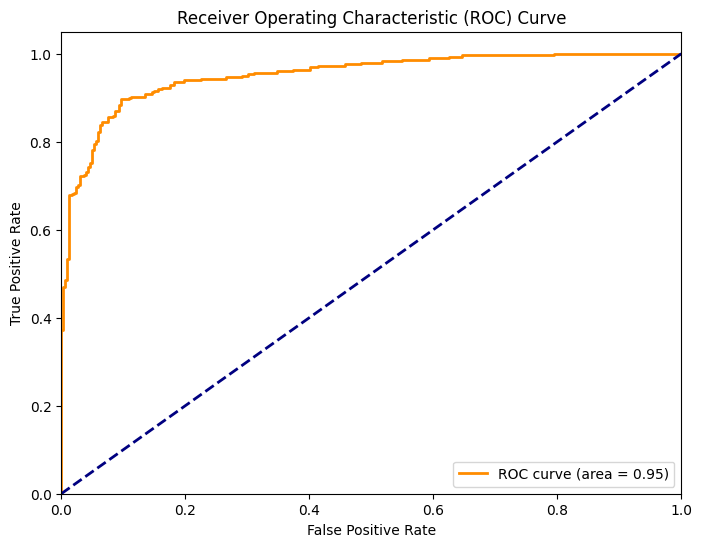

Validation Loss: 0.27550172805786133
Validation Accuracy: 0.8821428418159485
Test Loss: 0.30003541707992554
Test Accuracy: 0.8933333158493042
ROC AUC: 0.9514311747188763
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [43]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+GlobalAveragePooling+Dense

In [44]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add additional dense layer
x = Dense(1024, activation='relu')(x)

# Add one more dense layer if needed
# x = Dense(512, activation='relu')(x)

# Add final prediction layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_16   │ (None, 230, 230,  │          0 │ input_layer_8[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_17   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,290,113 (77.40 MB)

 Trainable params: 1,968,129 (7.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [45]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.6528 - loss: 0.6343 - val_accuracy: 0.8000 - val_loss: 0.4716
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8064 - loss: 0.4718 - val_accuracy: 0.8786 - val_loss: 0.3892
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8717 - loss: 0.3785 - val_accuracy: 0.8571 - val_loss: 0.3614
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8616 - loss: 0.3522 - val_accuracy: 0.8893 - val_loss: 0.3340
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8688 - loss: 0.3385 - val_accuracy: 0.8536 - val_loss: 0.3528
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8812 - loss: 0.3037 - val_accuracy: 0.8857 - val_loss: 0.3139
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9019 - loss: 0.2942 - val_accuracy: 0.8786 - val_loss: 0.3052
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8975 - loss: 0.2777 - val_accuracy: 0.8643 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step 
Inference Time: 11.094958543777466 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 847ms/step


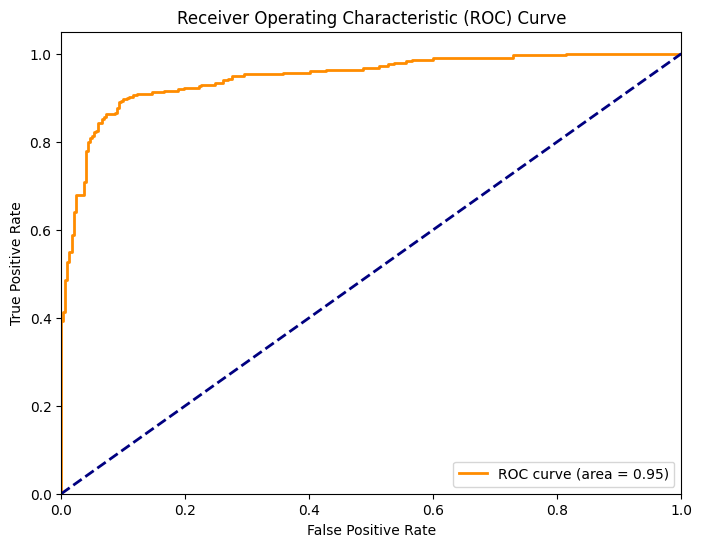

Validation Loss: 0.26505789160728455
Validation Accuracy: 0.8928571343421936
Test Loss: 0.28853949904441833
Test Accuracy: 0.8966666460037231
ROC AUC: 0.9468865282901462
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [46]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [47]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9606 - loss: 0.1391 - val_accuracy: 0.8750 - val_loss: 0.2745
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9543 - loss: 0.1344 - val_accuracy: 0.8893 - val_loss: 0.2672
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9564 - loss: 0.1356 - val_accuracy: 0.8821 - val_loss: 0.2638
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9662 - loss: 0.1223 - val_accuracy: 0.8786 - val_loss: 0.2674
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9638 - loss: 0.1291 - val_accuracy: 0.8714 - val_loss: 0.2804
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9599 - loss: 0.1286 - val_accuracy: 0.8643 - val_loss: 0.3471
Epoch 7/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9617 - loss: 0.1239 - val_accuracy: 0.8714 - val_loss: 0.2697
Epoch 8/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9825 - loss: 0.0977 - val_accuracy: 0.8857 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 818ms/step
Inference Time: 7.577501058578491 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 839ms/step


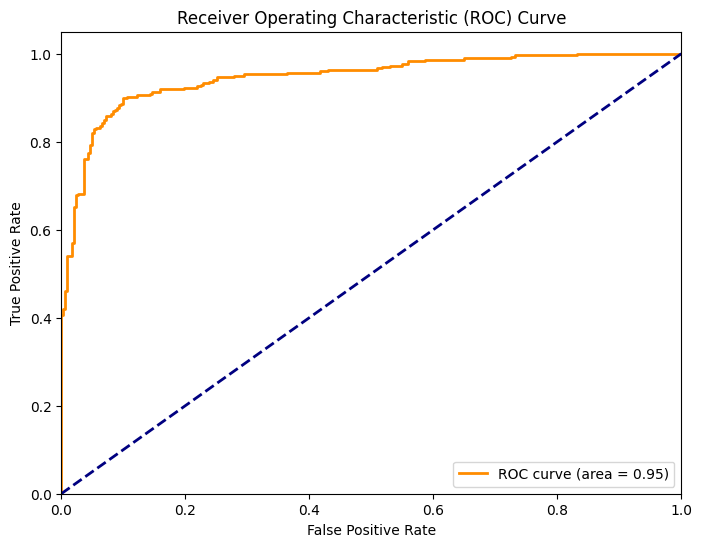

Validation Loss: 0.263769268989563
Validation Accuracy: 0.8821428418159485
Test Loss: 0.28988978266716003
Test Accuracy: 0.8983333110809326
ROC AUC: 0.9465198453264589
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [48]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [49]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9713 - loss: 0.1209 - val_accuracy: 0.8750 - val_loss: 0.2690
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9709 - loss: 0.1130 - val_accuracy: 0.8786 - val_loss: 0.2734
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9673 - loss: 0.1316 - val_accuracy: 0.8750 - val_loss: 0.2661
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9803 - loss: 0.1118 - val_accuracy: 0.8714 - val_loss: 0.2690
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9804 - loss: 0.1031 - val_accuracy: 0.8786 - val_loss: 0.2699
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9725 - loss: 0.1042 - val_accuracy: 0.8750 - val_loss: 0.2838
Epoch 7/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9779 - loss: 0.1042 - val_accuracy: 0.8786 - val_loss: 0.2723
Epoch 8/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9688 - loss: 0.1126 - val_accuracy: 0.8714 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 820ms/step
Inference Time: 7.61002779006958 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 838ms/step


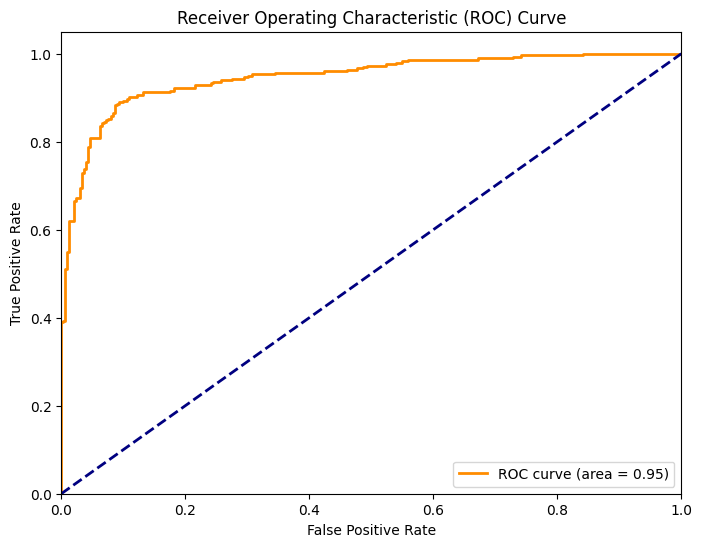

Validation Loss: 0.26613104343414307
Validation Accuracy: 0.875
Test Loss: 0.2940339148044586
Test Accuracy: 0.8983333110809326
ROC AUC: 0.946875416685186
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [50]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [51]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9597 - loss: 0.1274 - val_accuracy: 0.8750 - val_loss: 0.2701
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9749 - loss: 0.1116 - val_accuracy: 0.8750 - val_loss: 0.2694
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9698 - loss: 0.1210 - val_accuracy: 0.8714 - val_loss: 0.2793
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9783 - loss: 0.0955 - val_accuracy: 0.8714 - val_loss: 0.2945
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9804 - loss: 0.0999 - val_accuracy: 0.8714 - val_loss: 0.2805
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9765 - loss: 0.0908 - val_accuracy: 0.8679 - val_loss: 0.2786
Epoch 7/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9679 - loss: 0.1041 - val_accuracy: 0.8714 - val_loss: 0.2753
Training Time: 261.49537467956543 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 818ms/step
Inference Time: 7.506976127624512 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 836ms/step


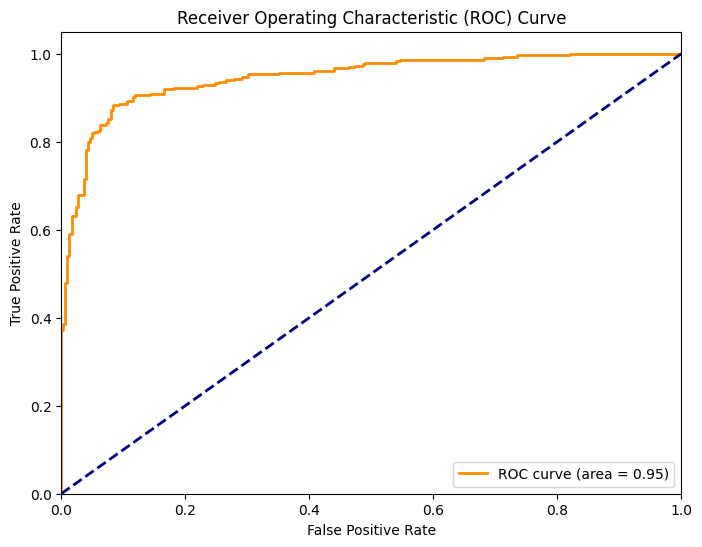

Validation Loss: 0.269398033618927
Validation Accuracy: 0.875
Test Loss: 0.3037581145763397
Test Accuracy: 0.8883333206176758
ROC AUC: 0.9470309791546291
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [52]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense

In [53]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Conv2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add additional layers
x = base_model.output

# Add Conv2D layer
x = Conv2D(64, (3, 3), activation='relu')(x)

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add Dropout layer
x = Dropout(0.5)(x)

# Add Dense layer
x = Dense(1024, activation='relu')(x)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_18   │ (None, 230, 230,  │          0 │ input_layer_9[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_19   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 19,495,553 (74.37 MB)

 Trainable params: 1,173,569 (4.48 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [54]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.5569 - loss: 0.6933 - val_accuracy: 0.6679 - val_loss: 0.5892
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.6819 - loss: 0.5880 - val_accuracy: 0.8643 - val_loss: 0.4329
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.7993 - loss: 0.4661 - val_accuracy: 0.8536 - val_loss: 0.3624
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8214 - loss: 0.4140 - val_accuracy: 0.8857 - val_loss: 0.3455
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8204 - loss: 0.4013 - val_accuracy: 0.8821 - val_loss: 0.3125
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8624 - loss: 0.3450 - val_accuracy: 0.8679 - val_loss: 0.3049
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8693 - loss: 0.3183 - val_accuracy: 0.8786 - val_loss: 0.2860
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8915 - loss: 0.2771 - val_accuracy: 0.8821 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step 
Inference Time: 12.18407130241394 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 845ms/step


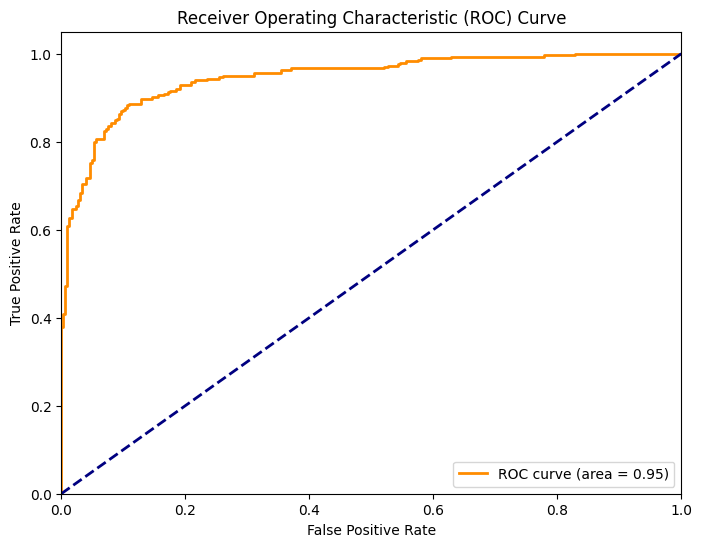

Validation Loss: 0.24964454770088196
Validation Accuracy: 0.8714285492897034
Test Loss: 0.2960539758205414
Test Accuracy: 0.8833333253860474
ROC AUC: 0.9461864971776524
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [55]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [56]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9125 - loss: 0.2071 - val_accuracy: 0.8750 - val_loss: 0.2627
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9228 - loss: 0.2005 - val_accuracy: 0.8786 - val_loss: 0.2521
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9214 - loss: 0.1862 - val_accuracy: 0.8786 - val_loss: 0.2622
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9078 - loss: 0.2118 - val_accuracy: 0.8857 - val_loss: 0.2465
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9406 - loss: 0.1645 - val_accuracy: 0.8821 - val_loss: 0.2725
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9336 - loss: 0.1875 - val_accuracy: 0.8821 - val_loss: 0.2428
Epoch 7/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9382 - loss: 0.1496 - val_accuracy: 0.8786 - val_loss: 0.2936
Epoch 8/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9239 - loss: 0.1768 - val_accuracy: 0.8786 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 821ms/step
Inference Time: 7.530395746231079 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 840ms/step


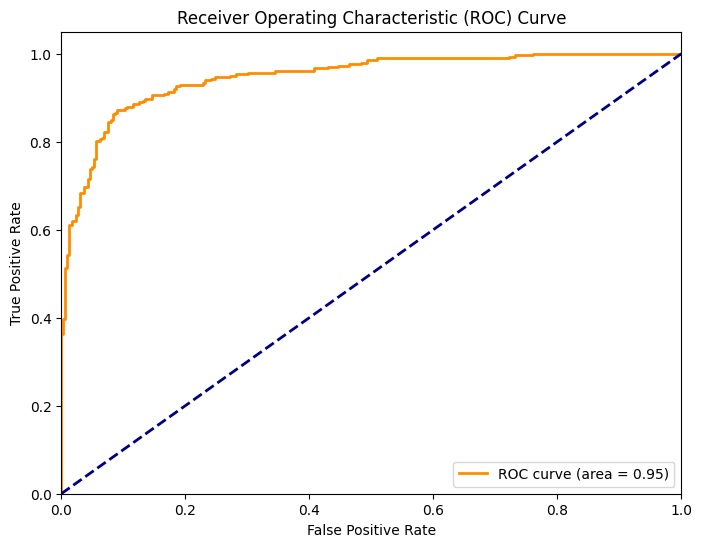

Validation Loss: 0.24280783534049988
Validation Accuracy: 0.8821428418159485
Test Loss: 0.3073633909225464
Test Accuracy: 0.8866666555404663
ROC AUC: 0.9469643095248678
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [57]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [58]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9340 - loss: 0.1592 - val_accuracy: 0.8750 - val_loss: 0.2517
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9370 - loss: 0.1563 - val_accuracy: 0.8786 - val_loss: 0.2916
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9431 - loss: 0.1606 - val_accuracy: 0.8857 - val_loss: 0.2478
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9514 - loss: 0.1298 - val_accuracy: 0.8857 - val_loss: 0.2552
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9375 - loss: 0.1625 - val_accuracy: 0.8893 - val_loss: 0.2513
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9616 - loss: 0.1079 - val_accuracy: 0.8750 - val_loss: 0.2446
Epoch 7/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9697 - loss: 0.1049 - val_accuracy: 0.8786 - val_loss: 0.2560
Epoch 8/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9600 - loss: 0.1124 - val_accuracy: 0.8964 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 818ms/step
Inference Time: 7.517608880996704 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 837ms/step


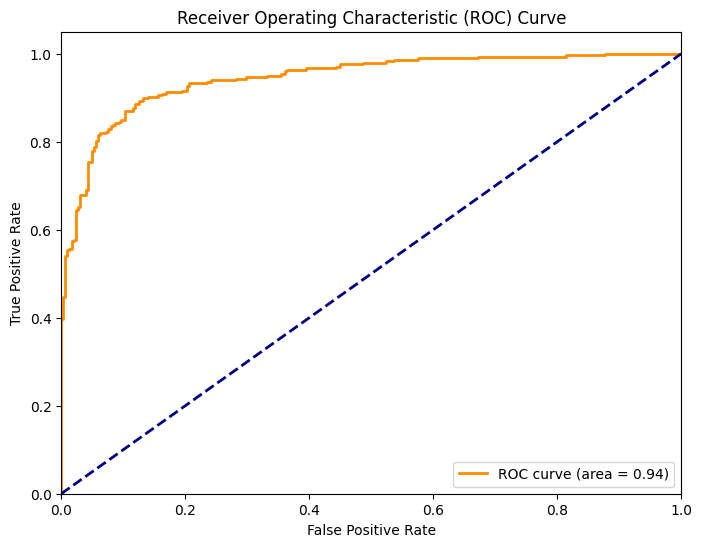

Validation Loss: 0.24333630502223969
Validation Accuracy: 0.8964285850524902
Test Loss: 0.3492613434791565
Test Accuracy: 0.878333330154419
ROC AUC: 0.9445975376683408
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [59]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [60]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9685 - loss: 0.1000 - val_accuracy: 0.8750 - val_loss: 0.2591
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9636 - loss: 0.1111 - val_accuracy: 0.8786 - val_loss: 0.2624
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9714 - loss: 0.0846 - val_accuracy: 0.8786 - val_loss: 0.2843
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9714 - loss: 0.0866 - val_accuracy: 0.8821 - val_loss: 0.2700
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9700 - loss: 0.0767 - val_accuracy: 0.9036 - val_loss: 0.2722
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9757 - loss: 0.0748 - val_accuracy: 0.8893 - val_loss: 0.2932
Training Time: 226.92968606948853 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 836ms/step
Inference Time: 7.660472393035889 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 837ms/step


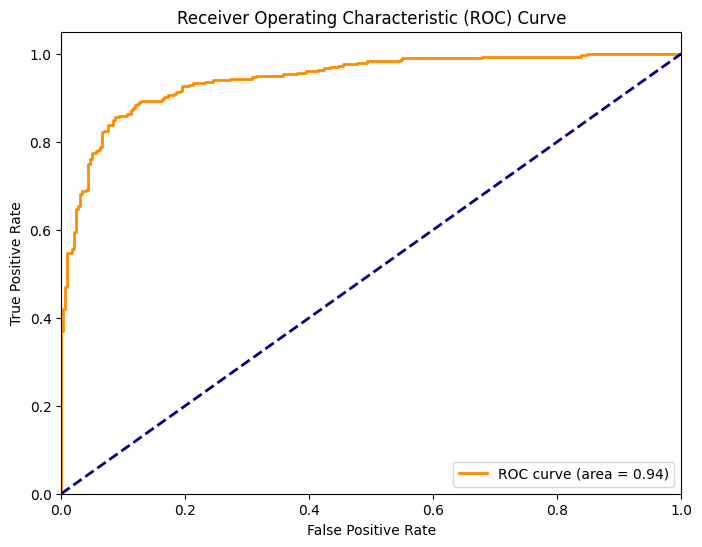

Validation Loss: 0.25912749767303467
Validation Accuracy: 0.875
Test Loss: 0.36081355810165405
Test Accuracy: 0.875
ROC AUC: 0.9435197119871994
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [61]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+LSTM+Dense

In [64]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, LSTM, Reshape, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Global average pooling
x = GlobalAveragePooling2D()(x)

# Reshape to fit LSTM input
x = Reshape((1, -1))(x)

# LSTM layer
x = LSTM(64)(x)

# Dense layer
x = Dense(1024, activation='relu')(x)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_24   │ (None, 230, 230,  │          0 │ input_layer_12[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_25   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_2… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 18,897,729 (72.09 MB)

 Trainable params: 575,745 (2.20 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [65]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.5129 - loss: 0.6915 - val_accuracy: 0.7464 - val_loss: 0.6672
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - accuracy: 0.7219 - loss: 0.6543 - val_accuracy: 0.8107 - val_loss: 0.5745
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.7622 - loss: 0.5486 - val_accuracy: 0.8357 - val_loss: 0.4329
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8114 - loss: 0.4284 - val_accuracy: 0.8536 - val_loss: 0.3609
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8602 - loss: 0.3517 - val_accuracy: 0.8536 - val_loss: 0.3377
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8820 - loss: 0.3062 - val_accuracy: 0.8714 - val_loss: 0.3220
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8950 - loss: 0.2933 - val_accuracy: 0.8750 - val_loss: 0.3097
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.8642 - loss: 0.3109 - val_accuracy: 0.8679 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step 
Inference Time: 11.379008769989014 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 841ms/step


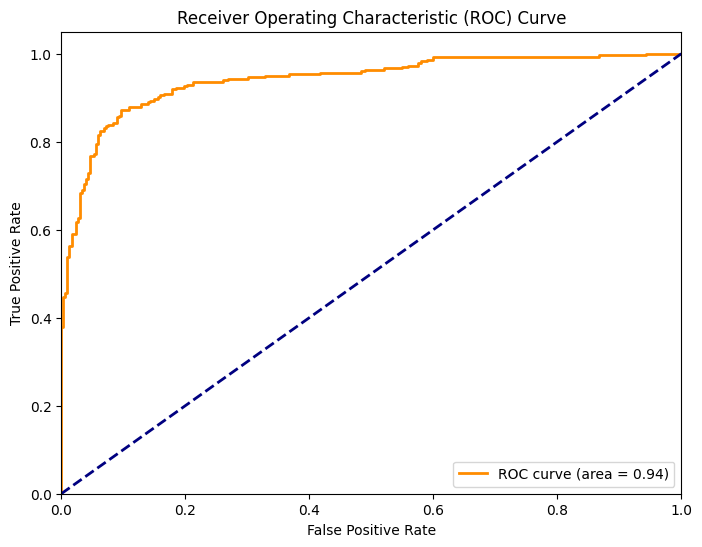

Validation Loss: 0.28985321521759033
Validation Accuracy: 0.8607142567634583
Test Loss: 0.3022367060184479
Test Accuracy: 0.8833333253860474
ROC AUC: 0.941075158895951
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [66]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [67]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9207 - loss: 0.2246 - val_accuracy: 0.8643 - val_loss: 0.2904
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9175 - loss: 0.2192 - val_accuracy: 0.8643 - val_loss: 0.2904
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9244 - loss: 0.2016 - val_accuracy: 0.8464 - val_loss: 0.3174
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9178 - loss: 0.2113 - val_accuracy: 0.8571 - val_loss: 0.2914
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9363 - loss: 0.1878 - val_accuracy: 0.8679 - val_loss: 0.2894
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9298 - loss: 0.1889 - val_accuracy: 0.8500 - val_loss: 0.3167
Epoch 7/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9341 - loss: 0.1874 - val_accuracy: 0.8607 - val_loss: 0.2907
Epoch 8/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9374 - loss: 0.1673 - val_accuracy: 0.8643 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 824ms/step
Inference Time: 7.538425922393799 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 848ms/step


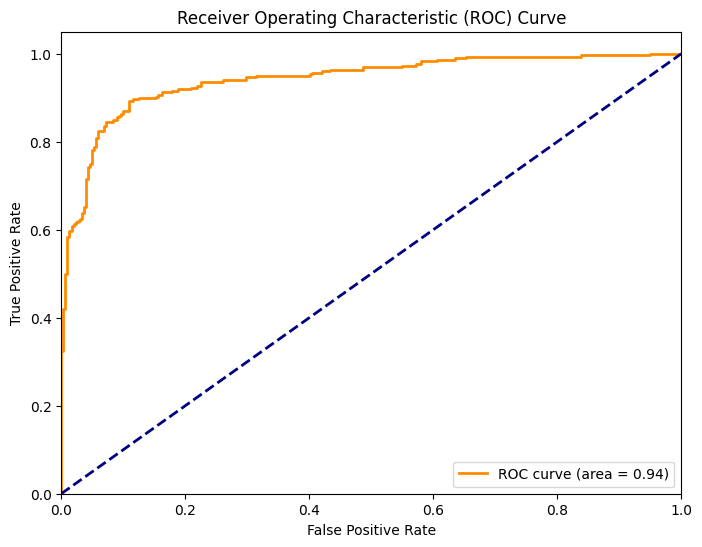

Validation Loss: 0.2893747091293335
Validation Accuracy: 0.8678571581840515
Test Loss: 0.30813977122306824
Test Accuracy: 0.8833333253860474
ROC AUC: 0.9416640739588427
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [68]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [69]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9293 - loss: 0.1819 - val_accuracy: 0.8571 - val_loss: 0.2923
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9235 - loss: 0.1892 - val_accuracy: 0.8607 - val_loss: 0.2888
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9341 - loss: 0.1647 - val_accuracy: 0.8571 - val_loss: 0.2997
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9372 - loss: 0.1629 - val_accuracy: 0.8464 - val_loss: 0.2978
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9401 - loss: 0.1637 - val_accuracy: 0.8607 - val_loss: 0.2939
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9295 - loss: 0.1749 - val_accuracy: 0.8536 - val_loss: 0.3023
Epoch 7/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9445 - loss: 0.1396 - val_accuracy: 0.8357 - val_loss: 0.3121
Training Time: 263.23265075683594 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 830ms/step
Inference Time: 7.730907678604126 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 845ms/step


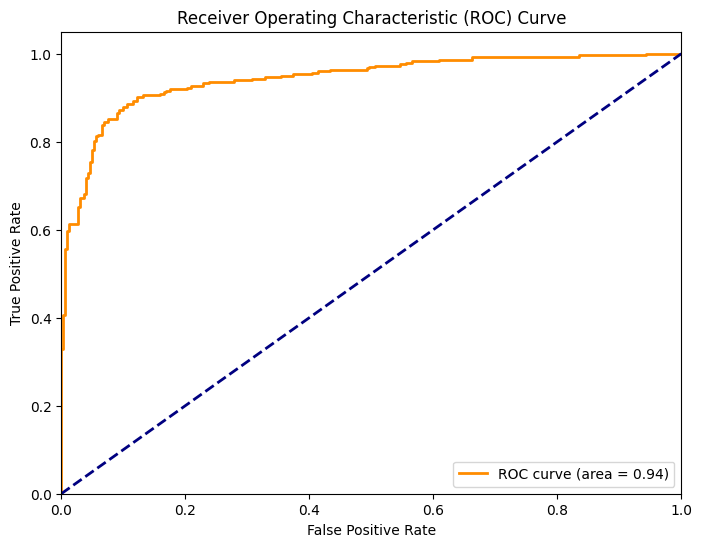

Validation Loss: 0.28875383734703064
Validation Accuracy: 0.8607142567634583
Test Loss: 0.30533382296562195
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9429307969243078
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [70]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [71]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9412 - loss: 0.1705 - val_accuracy: 0.8607 - val_loss: 0.2910
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9240 - loss: 0.1696 - val_accuracy: 0.8429 - val_loss: 0.3214
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9423 - loss: 0.1510 - val_accuracy: 0.8571 - val_loss: 0.3290
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9282 - loss: 0.1618 - val_accuracy: 0.8714 - val_loss: 0.2955
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9456 - loss: 0.1573 - val_accuracy: 0.8643 - val_loss: 0.2950
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9452 - loss: 0.1534 - val_accuracy: 0.8357 - val_loss: 0.3177
Training Time: 226.33472442626953 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 828ms/step
Inference Time: 7.575416326522827 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 847ms/step


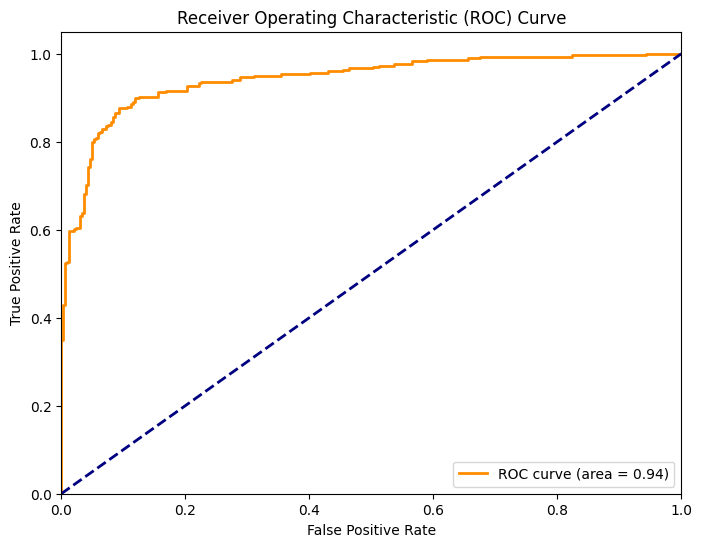

Validation Loss: 0.29097315669059753
Validation Accuracy: 0.8607142567634583
Test Loss: 0.30657660961151123
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9424974443308591
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [72]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+GRU+Dense

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, GRU, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Global average pooling
x = GlobalAveragePooling2D()(x)

# Reshape to fit GRU input
x = Lambda(lambda x: tf.expand_dims(x, axis=1))(x)

# GRU layer
x = GRU(64)(x)

# Dense layer
x = Dense(1024, activation='relu')(x)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 18,770,881 (71.61 MB)

 Trainable params: 448,897 (1.71 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [8]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - accuracy: 0.6099 - loss: 0.6791 - val_accuracy: 0.6429 - val_loss: 0.6341
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - accuracy: 0.6759 - loss: 0.6211 - val_accuracy: 0.7929 - val_loss: 0.5307
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8085 - loss: 0.5028 - val_accuracy: 0.8429 - val_loss: 0.4255
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8332 - loss: 0.4317 - val_accuracy: 0.8464 - val_loss: 0.3745
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8479 - loss: 0.3717 - val_accuracy: 0.8464 - val_loss: 0.3560
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8435 - loss: 0.3505 - val_accuracy: 0.8607 - val_loss: 0.3442
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8691 - loss: 0.3238 - val_accuracy: 0.8571 - val_loss: 0.3153
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8700 - loss: 0.3177 - val_accuracy: 0.8464 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step 
Inference Time: 11.497375965118408 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 842ms/step


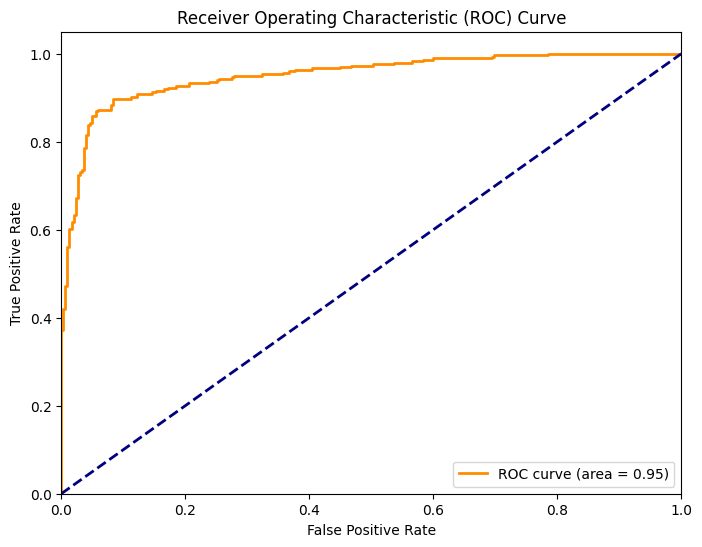

Validation Loss: 0.2589067220687866
Validation Accuracy: 0.8857142925262451
Test Loss: 0.2791423201560974
Test Accuracy: 0.9016666412353516
ROC AUC: 0.9512200542246322
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [9]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [10]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9458 - loss: 0.1441 - val_accuracy: 0.8821 - val_loss: 0.2621
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9515 - loss: 0.1438 - val_accuracy: 0.8857 - val_loss: 0.2696
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9541 - loss: 0.1263 - val_accuracy: 0.8857 - val_loss: 0.2662
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9534 - loss: 0.1414 - val_accuracy: 0.8786 - val_loss: 0.2624
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9503 - loss: 0.1371 - val_accuracy: 0.8893 - val_loss: 0.2643
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9566 - loss: 0.1211 - val_accuracy: 0.8857 - val_loss: 0.2812
Training Time: 227.41235542297363 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 819ms/step
Inference Time: 7.511306047439575 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 842ms/step


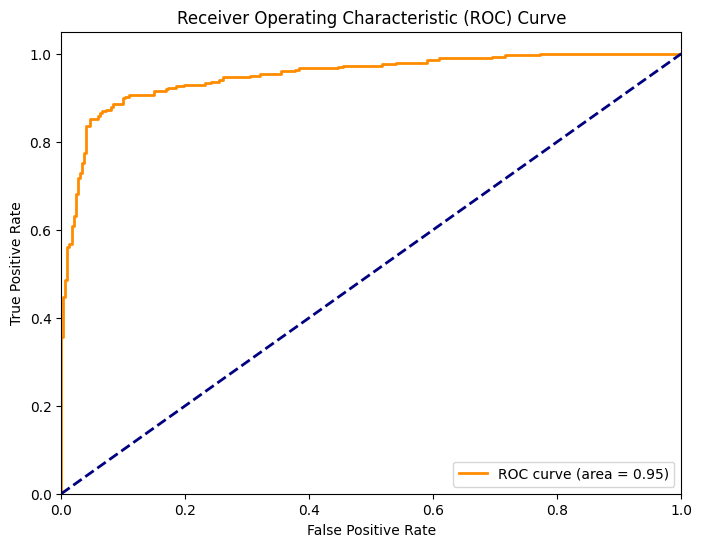

Validation Loss: 0.26208046078681946
Validation Accuracy: 0.8821428418159485
Test Loss: 0.2834451198577881
Test Accuracy: 0.8999999761581421
ROC AUC: 0.9507422552113428
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [11]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [12]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9441 - loss: 0.1573 - val_accuracy: 0.8893 - val_loss: 0.2707
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9639 - loss: 0.1250 - val_accuracy: 0.8929 - val_loss: 0.2635
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9565 - loss: 0.1316 - val_accuracy: 0.8893 - val_loss: 0.2721
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9557 - loss: 0.1293 - val_accuracy: 0.8929 - val_loss: 0.2697
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9641 - loss: 0.1110 - val_accuracy: 0.8857 - val_loss: 0.2696
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9612 - loss: 0.1164 - val_accuracy: 0.8857 - val_loss: 0.2695
Epoch 7/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9556 - loss: 0.1236 - val_accuracy: 0.8821 - val_loss: 0.2777
Training Time: 264.6194603443146 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 836ms/step
Inference Time: 7.734929084777832 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 839ms/step


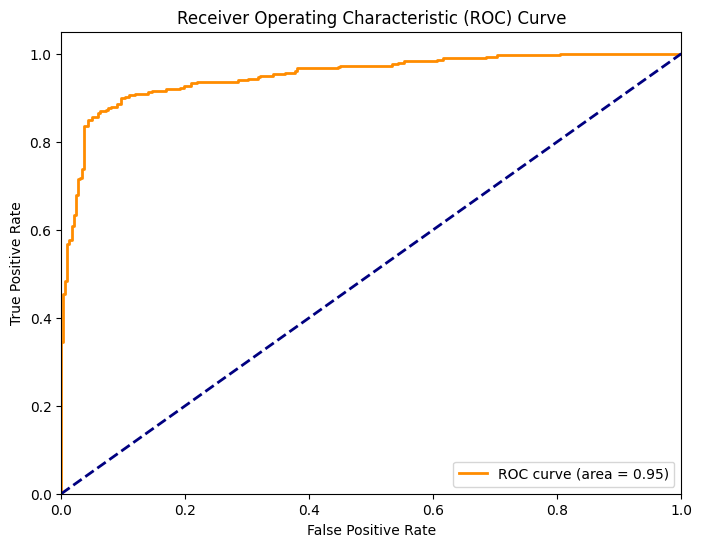

Validation Loss: 0.26351138949394226
Validation Accuracy: 0.8928571343421936
Test Loss: 0.2911891043186188
Test Accuracy: 0.8983333110809326
ROC AUC: 0.9504644650873372
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [13]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [14]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9658 - loss: 0.1208 - val_accuracy: 0.8893 - val_loss: 0.2775
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9603 - loss: 0.1229 - val_accuracy: 0.8821 - val_loss: 0.2791
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9590 - loss: 0.1406 - val_accuracy: 0.8821 - val_loss: 0.2662
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9688 - loss: 0.1099 - val_accuracy: 0.8857 - val_loss: 0.2758
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9529 - loss: 0.1183 - val_accuracy: 0.8750 - val_loss: 0.2879
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9730 - loss: 0.1068 - val_accuracy: 0.8929 - val_loss: 0.2736
Epoch 7/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9578 - loss: 0.1238 - val_accuracy: 0.8750 - val_loss: 0.2801
Epoch 8/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9648 - loss: 0.1101 - val_accuracy: 0.8857 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 828ms/step
Inference Time: 7.589273929595947 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 834ms/step


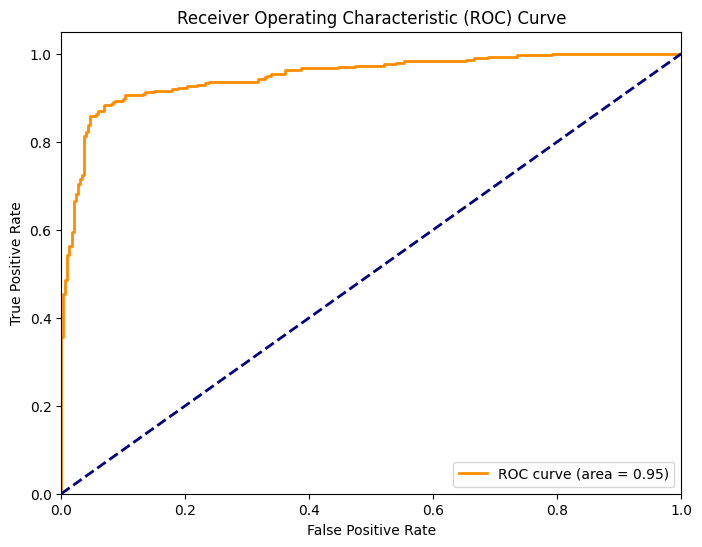

Validation Loss: 0.26615095138549805
Validation Accuracy: 0.8821428418159485
Test Loss: 0.2942125201225281
Test Accuracy: 0.9016666412353516
ROC AUC: 0.9497310991599627
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [15]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Attention Mechanism+Dense

In [16]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Attention
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Define custom attention layer
class AttentionLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        super(AttentionLayer, self).build(input_shape)

    def call(self, inputs):
        x, alpha = inputs
        return tf.reduce_sum(x * tf.expand_dims(alpha, -1), axis=1)

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Global average pooling
x = GlobalAveragePooling2D()(x)

# Dense layer
x = Dense(1024, activation='relu')(x)

# Attention mechanism
alpha = Dense(1, activation='softmax')(x)
context = AttentionLayer()([x, alpha])

# Dense layer after attention
x = Dense(512, activation='relu')(context)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,815,426 (79.40 MB)

 Trainable params: 2,493,442 (9.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [17]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50


/home/lab4/.local/lib/python3.10/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 866ms/step - accuracy: 0.5075 - loss: 3.0634

/home/lab4/.local/lib/python3.10/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


35/35 ━━━━━━━━━━━━━━━━━━━━ 46s 1s/step - accuracy: 0.5070 - loss: 3.0303 - val_accuracy: 0.5214 - val_loss: 1.9883
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5136 - loss: 1.2637 - val_accuracy: 0.5214 - val_loss: 2.1172
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5109 - loss: 1.3687 - val_accuracy: 0.4929 - val_loss: 0.7572
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5044 - loss: 1.1082 - val_accuracy: 0.4786 - val_loss: 0.9701
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5028 - loss: 1.5814 - val_accuracy: 0.4786 - val_loss: 1.0543
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4882 - loss: 0.9567 - val_accuracy: 0.5214 - val_loss: 2.0184
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5109 - loss: 1.2947 - val_accuracy: 0.5214 - val_loss: 0.8732
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5140 - loss: 1.8357 - val_accuracy: 0.5214 - val_loss: 1.8406
Tra

9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step 
Inference Time: 11.951659440994263 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 848ms/step


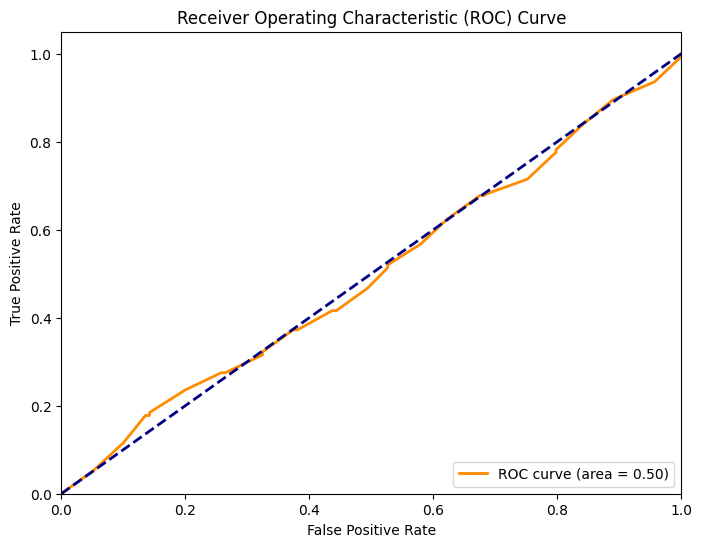

Validation Loss: 0.7572399377822876
Validation Accuracy: 0.4928571283817291
Test Loss: 0.8451686501502991
Test Accuracy: 0.49666666984558105
ROC AUC: 0.49768878616827417
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [18]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [19]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4831 - loss: 1.6193 - val_accuracy: 0.5143 - val_loss: 0.8466
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4919 - loss: 1.5027 - val_accuracy: 0.4786 - val_loss: 6.8281
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5443 - loss: 3.9728 - val_accuracy: 0.5214 - val_loss: 2.1409
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5103 - loss: 1.6920 - val_accuracy: 0.4857 - val_loss: 0.7872
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5329 - loss: 0.9486 - val_accuracy: 0.4786 - val_loss: 1.6942
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5035 - loss: 1.1424 - val_accuracy: 0.5214 - val_loss: 1.0641
Epoch 7/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5140 - loss: 0.9484 - val_accuracy: 0.5214 - val_loss: 0.9456
Epoch 8/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4644 - loss: 0.8148 - val_accuracy: 0.5143 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 830ms/step
Inference Time: 7.702867031097412 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 848ms/step


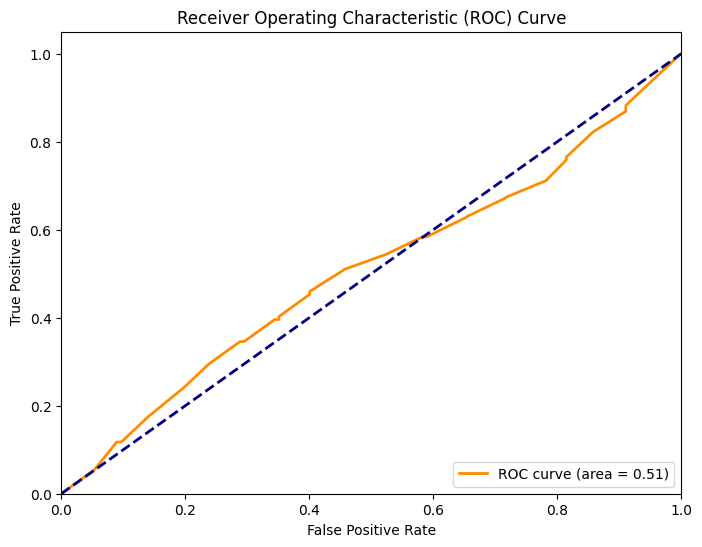

Validation Loss: 0.7146909832954407
Validation Accuracy: 0.5142857432365417
Test Loss: 0.7932512164115906
Test Accuracy: 0.476666659116745
ROC AUC: 0.5071003155695809
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [20]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [21]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4388 - loss: 1.2232 - val_accuracy: 0.4786 - val_loss: 1.3626
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5168 - loss: 1.0525 - val_accuracy: 0.5286 - val_loss: 0.7700
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5237 - loss: 0.8530 - val_accuracy: 0.4786 - val_loss: 1.5720
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5004 - loss: 1.3341 - val_accuracy: 0.5357 - val_loss: 0.7566
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5165 - loss: 0.9132 - val_accuracy: 0.5643 - val_loss: 0.7733
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4947 - loss: 0.8591 - val_accuracy: 0.5214 - val_loss: 1.2984
Epoch 7/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5056 - loss: 1.0909 - val_accuracy: 0.5214 - val_loss: 1.4232
Epoch 8/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4961 - loss: 1.0342 - val_accuracy: 0.5429 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 833ms/step
Inference Time: 7.787609577178955 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 843ms/step


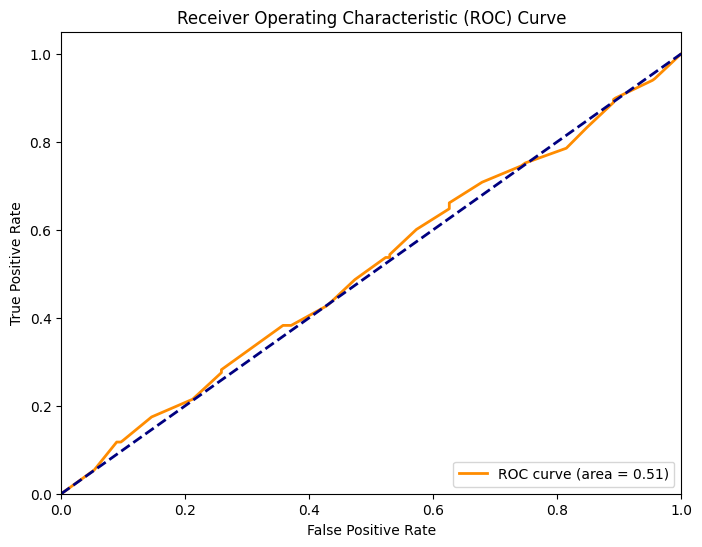

Validation Loss: 0.7364558577537537
Validation Accuracy: 0.5642856955528259
Test Loss: 0.7475745677947998
Test Accuracy: 0.503333330154419
ROC AUC: 0.5098004355749144
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [22]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [23]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5151 - loss: 0.9468 - val_accuracy: 0.5500 - val_loss: 0.7332
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4942 - loss: 0.8196 - val_accuracy: 0.5500 - val_loss: 0.7916
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.4979 - loss: 0.8430 - val_accuracy: 0.5214 - val_loss: 1.0289
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5048 - loss: 1.0442 - val_accuracy: 0.5357 - val_loss: 0.8747
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5203 - loss: 0.8837 - val_accuracy: 0.5643 - val_loss: 0.7993
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5281 - loss: 0.8985 - val_accuracy: 0.5643 - val_loss: 0.7770
Training Time: 227.00649571418762 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 828ms/step
Inference Time: 7.611233472824097 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 845ms/step


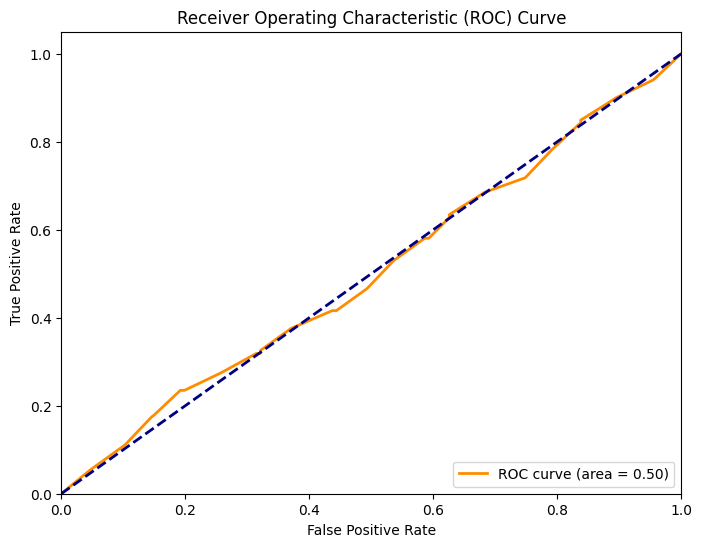

Validation Loss: 0.7331911325454712
Validation Accuracy: 0.550000011920929
Test Loss: 0.7493965029716492
Test Accuracy: 0.5
ROC AUC: 0.5007000311124938
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [24]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Capsule network+Dense

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Reshape, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201

# Define Capsule Layer
class CapsuleLayer(tf.keras.layers.Layer):
    def __init__(self, num_capsule, dim_capsule, routings=3, **kwargs):
        super(CapsuleLayer, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings

    def build(self, input_shape):
        input_dim_capsule = input_shape[-1]
        self.W = self.add_weight(shape=[input_dim_capsule, self.num_capsule * self.dim_capsule],
                                 initializer='glorot_uniform',
                                 name='W')

    def call(self, u_vecs):
        u_hat_vecs = tf.reduce_sum(tf.expand_dims(u_vecs, -1) * tf.expand_dims(self.W, 0), axis=-2)
        b = tf.zeros(shape=[tf.shape(u_hat_vecs)[0], self.num_capsule])
        for i in range(self.routings):
            c = tf.nn.softmax(b, axis=1)
            s_j = tf.reduce_sum(tf.multiply(c[:, :, None], u_hat_vecs), axis=1)
            v_j = self.squash(s_j)
            if i < self.routings - 1:
                b += tf.reduce_sum(tf.multiply(v_j[:, None, :], u_hat_vecs), axis=-1)
        return v_j

    def squash(self, s_j):
        s_squared_norm = tf.reduce_sum(tf.square(s_j), axis=-1, keepdims=True)
        scale = s_squared_norm / (1 + s_squared_norm) / tf.sqrt(s_squared_norm + tf.keras.backend.epsilon())
        return scale * s_j

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Flatten the output of DenseNet
x = Flatten()(x)

# Reshape to fit Capsule Layer
x = Reshape((-1, x.shape[-1]))(x)

# Capsule Network
capsule = CapsuleLayer(num_capsule=10, dim_capsule=16, routings=3)(x)  # Example: 10 capsules with dimension 16

# Flatten the output
capsule = Flatten()(capsule)

# Dense layer after Capsule Network
output = Dense(1, activation='sigmoid')(capsule)  # Use a single output unit for binary classification

# Create the full model
model = Model(inputs=base_model.input, outputs=output)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with Adam optimizer
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 33,374,945 (127.32 MB)

 Trainable params: 15,052,961 (57.42 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [8]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.6627 - loss: 0.6746 - val_accuracy: 0.7929 - val_loss: 0.4989
Epoch 2/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.8299 - loss: 0.4404 - val_accuracy: 0.7893 - val_loss: 0.4600
Epoch 3/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.8766 - loss: 0.3495 - val_accuracy: 0.8107 - val_loss: 0.4558
Epoch 4/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.8940 - loss: 0.3092 - val_accuracy: 0.8571 - val_loss: 0.3837
Epoch 5/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9278 - loss: 0.2240 - val_accuracy: 0.8464 - val_loss: 0.3990
Epoch 6/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9208 - loss: 0.2290 - val_accuracy: 0.8714 - val_loss: 0.3739
Epoch 7/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9702 - loss: 0.1217 - val_accuracy: 0.8321 - val_loss: 0.4102
Epoch 8/50
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9772 - loss: 0.0995 - val_accuracy: 0.8643 - val_loss:

9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 950ms/step
Inference Time: 8.710157632827759 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step


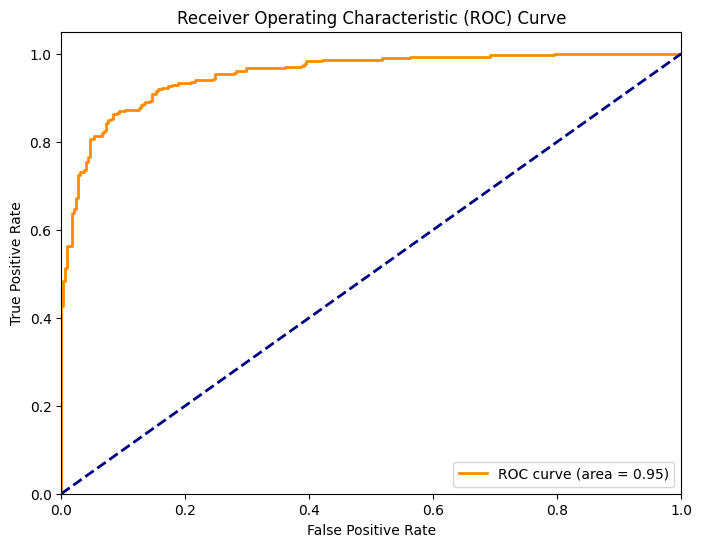

Validation Loss: 0.3739131689071655
Validation Accuracy: 0.8714285492897034
Test Loss: 0.3052256107330322
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9531201386728299
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [10]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [12]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9608 - loss: 0.1436 - val_accuracy: 0.8429 - val_loss: 0.4036
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9775 - loss: 0.0981 - val_accuracy: 0.8643 - val_loss: 0.4244
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9897 - loss: 0.0615 - val_accuracy: 0.8571 - val_loss: 0.4415
Epoch 4/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9929 - loss: 0.0543 - val_accuracy: 0.8429 - val_loss: 0.4679
Epoch 5/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9857 - loss: 0.0561 - val_accuracy: 0.8107 - val_loss: 0.4731
Epoch 6/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9873 - loss: 0.0564 - val_accuracy: 0.8536 - val_loss: 0.4762
Training Time: 362.7882249355316 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step
Inference Time: 9.359062910079956 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step


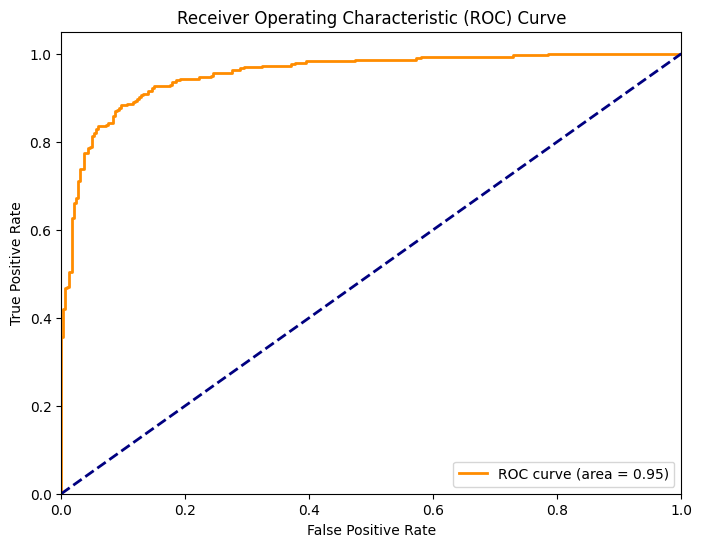

Validation Loss: 0.40357092022895813
Validation Accuracy: 0.8428571224212646
Test Loss: 0.3150840699672699
Test Accuracy: 0.8883333206176758
ROC AUC: 0.9545424241077379
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [13]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [14]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9792 - loss: 0.0943 - val_accuracy: 0.8643 - val_loss: 0.3859
Epoch 2/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9847 - loss: 0.0800 - val_accuracy: 0.8679 - val_loss: 0.4136
Epoch 3/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9716 - loss: 0.0859 - val_accuracy: 0.8250 - val_loss: 0.4546
Epoch 4/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9865 - loss: 0.0665 - val_accuracy: 0.8571 - val_loss: 0.4459
Epoch 5/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9905 - loss: 0.0423 - val_accuracy: 0.8750 - val_loss: 0.4422
Epoch 6/150
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9969 - loss: 0.0258 - val_accuracy: 0.8571 - val_loss: 0.4805
Training Time: 362.90991592407227 seconds


9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step
Inference Time: 9.294129610061646 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step


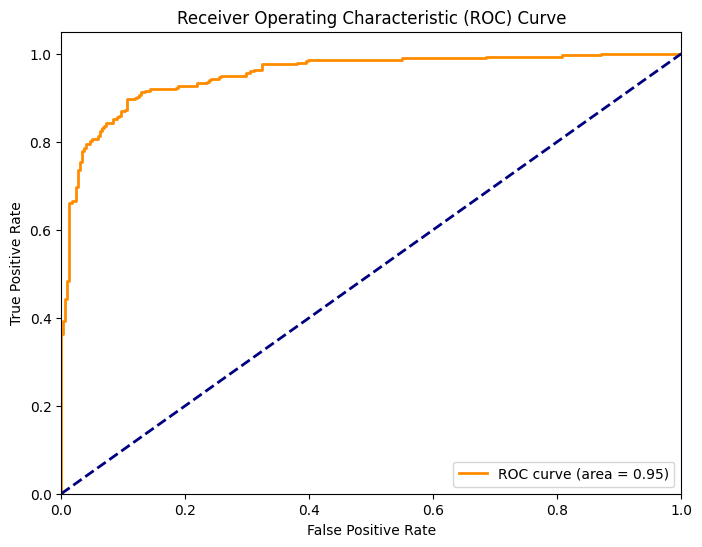

Validation Loss: 0.38588494062423706
Validation Accuracy: 0.8642857074737549
Test Loss: 0.3104498088359833
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9528312369438642
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [15]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [16]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9860 - loss: 0.0774 - val_accuracy: 0.8321 - val_loss: 0.4383
Epoch 2/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9771 - loss: 0.0813 - val_accuracy: 0.8571 - val_loss: 0.4479
Epoch 3/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9880 - loss: 0.0541 - val_accuracy: 0.8536 - val_loss: 0.4883
Epoch 4/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9939 - loss: 0.0412 - val_accuracy: 0.8786 - val_loss: 0.4189
Epoch 5/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9955 - loss: 0.0284 - val_accuracy: 0.8714 - val_loss: 0.4511
Epoch 6/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9934 - loss: 0.0220 - val_accuracy: 0.8857 - val_loss: 0.4482
Epoch 7/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.9984 - loss: 0.0186 - val_accuracy: 0.8714 - val_loss: 0.4757
Epoch 8/200
35/35 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.9871 - loss: 0.0377 - val_accuracy: 0.7750 - v

9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step
Inference Time: 9.282800912857056 seconds
19/19 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step


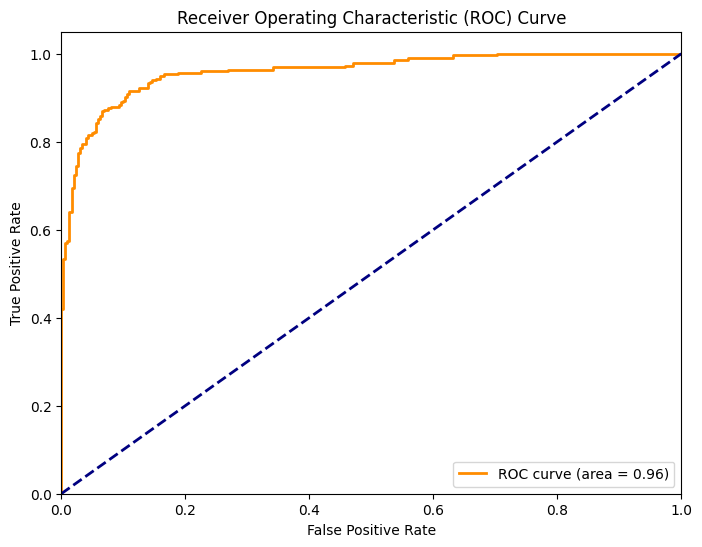

Validation Loss: 0.4189239740371704
Validation Accuracy: 0.8785714507102966
Test Loss: 0.3102113604545593
Test Accuracy: 0.8999999761581421
ROC AUC: 0.9598648828836838
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.50      1.00      0.67       302
           1       0.00      0.00      0.00       298

    accuracy                           0.50       600
   macro avg       0.25      0.50      0.33       600
weighted avg       0.25      0.50      0.34       600

Confusion Matrix:
[[302   0]
 [298   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [17]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_2000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_2000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")